<a href="https://colab.research.google.com/github/anthonyjlau/AI4All_Group15/blob/Anthony1/AI4ALL_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
###
### Import dependencies.
###

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer


from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.decomposition import PCA

from sklearn import linear_model
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import f1_score

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_excel("crimeCommuntiesData.xlsx")
df.head(10)

,communityName,state,countyCode,communityCode,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39.0,5320.0,11980,3.10,1.37,91.78,6.50,1.88,...,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,Marpletownship,PA,45.0,47616.0,23123,2.82,0.80,95.57,3.44,0.85,...,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,Tigardcity,OR,NaN,NaN,29344,2.43,0.74,94.33,3.43,2.35,...,274.0,758.14,1797.0,4972.19,136.0,376.30,22.0,60.87,218.59,6167.51
3,Gloversvillecity,NY,35.0,29443.0,16656,2.40,1.70,97.35,0.50,0.70,...,225.0,1301.78,716.0,4142.56,47.0,271.93,NaN,NaN,306.64,NaN
4,Bemidjicity,MN,7.0,5068.0,11245,2.76,0.53,89.16,1.17,0.52,...,91.0,728.93,1060.0,8490.87,91.0,728.93,5.0,40.05,NaN,9988.79
5,Springfieldcity,MO,NaN,NaN,140494,2.45,2.51,95.65,0.90,0.95,...,2094.0,1386.46,7690.0,5091.64,454.0,300.60,134.0,88.72,442.95,6867.42
6,Norwoodtown,MA,21.0,50250.0,28700,2.60,1.60,96.57,1.47,1.10,...,110.0,372.09,288.0,974.19,144.0,487.10,17.0,57.50,226.63,1890.88
7,Andersoncity,IN,NaN,NaN,59459,2.45,14.20,84.87,0.40,0.63,...,608.0,997.60,2250.0,3691.79,125.0,205.10,9.0,14.77,439.73,4909.26
8,Fargocity,ND,17.0,25700.0,74111,2.46,0.35,97.11,1.25,0.73,...,425.0,532.66,3149.0,3946.71,206.0,258.18,8.0,10.03,115.31,4747.58
9,Wacocity,TX,NaN,NaN,103590,2.62,23.14,67.60,0.92,16.35,...,2397.0,2221.81,6121.0,5673.63,1070.0,991.80,18.0,16.68,1544.24,8903.93


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215 entries, 0 to 2214
Columns: 146 entries, communityName to nonViolPerPop
dtypes: float64(116), int64(28), object(2)
memory usage: 2.5+ MB


In [ ]:
df.shape

(2215, 146)

In [ ]:
df.isnull().sum(axis = 0)

communityName             0
state                     0
countyCode             1221
communityCode          1224
population                0
                       ... 
autoTheftPerPop           3
arsons                   91
arsonsPerPop             91
ViolentCrimesPerPop     221
nonViolPerPop            97
Length: 146, dtype: int64

In [ ]:
def transform_model(df):
  si_most_freq = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
  df_nonull = pd.DataFrame(si_most_freq.fit_transform(df), columns = df.columns).astype(df.dtypes.to_dict())
  df_final = df_nonull.select_dtypes(include=np.number)
  return df_final

In [ ]:
df = transform_model(df)

In [ ]:
df.head(10)

,countyCode,communityCode,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,39.0,5320.0,11980,3.10,1.37,91.78,6.50,1.88,12.47,21.44,...,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,45.0,47616.0,23123,2.82,0.80,95.57,3.44,0.85,11.01,21.30,...,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,3.0,1000.0,29344,2.43,0.74,94.33,3.43,2.35,11.36,25.88,...,274.0,758.14,1797.0,4972.19,136.0,376.30,22.0,60.87,218.59,6167.51
3,35.0,29443.0,16656,2.40,1.70,97.35,0.50,0.70,12.55,25.20,...,225.0,1301.78,716.0,4142.56,47.0,271.93,0.0,0.00,306.64,2246.14
4,7.0,5068.0,11245,2.76,0.53,89.16,1.17,0.52,24.46,40.53,...,91.0,728.93,1060.0,8490.87,91.0,728.93,5.0,40.05,223.06,9988.79
5,3.0,1000.0,140494,2.45,2.51,95.65,0.90,0.95,18.09,32.89,...,2094.0,1386.46,7690.0,5091.64,454.0,300.60,134.0,88.72,442.95,6867.42
6,21.0,50250.0,28700,2.60,1.60,96.57,1.47,1.10,11.17,27.41,...,110.0,372.09,288.0,974.19,144.0,487.10,17.0,57.50,226.63,1890.88
7,3.0,1000.0,59459,2.45,14.20,84.87,0.40,0.63,15.31,27.93,...,608.0,997.60,2250.0,3691.79,125.0,205.10,9.0,14.77,439.73,4909.26
8,17.0,25700.0,74111,2.46,0.35,97.11,1.25,0.73,16.64,35.16,...,425.0,532.66,3149.0,3946.71,206.0,258.18,8.0,10.03,115.31,4747.58
9,3.0,1000.0,103590,2.62,23.14,67.60,0.92,16.35,19.88,34.55,...,2397.0,2221.81,6121.0,5673.63,1070.0,991.80,18.0,16.68,1544.24,8903.93


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2215 entries, 0 to 2214
Columns: 144 entries, countyCode to nonViolPerPop
dtypes: float64(116), int64(28)
memory usage: 2.4 MB


In [ ]:
pearsoncorr = df.corr(method='pearson', numeric_only=True)

In [ ]:
pearsoncorr

,countyCode,communityCode,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,...,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
countyCode,1.000000,0.359376,0.017719,-0.035304,0.073300,0.015886,-0.085030,-0.127785,0.050710,0.046936,...,0.006678,-0.100879,0.018934,-0.007600,0.000406,-0.056933,0.013325,0.025945,-0.071250,-0.045083
communityCode,0.359376,1.000000,-0.042369,-0.040368,-0.124419,0.248206,-0.118901,-0.222657,-0.083586,-0.092225,...,-0.071134,-0.265556,-0.074781,-0.239576,-0.044930,-0.112021,-0.044337,-0.094992,-0.253385,-0.269370
population,0.017719,-0.042369,1.000000,-0.018841,0.135641,-0.184685,0.088360,0.094048,-0.007624,0.046247,...,0.970524,0.119076,0.965977,0.066273,0.980709,0.244812,0.899293,0.156248,0.193259,0.120989
householdsize,-0.035304,-0.040368,-0.018841,1.000000,-0.047455,-0.230117,0.186779,0.485178,0.491481,0.384322,...,-0.034108,-0.102618,-0.048969,-0.237396,-0.011756,0.022381,-0.010521,-0.003443,-0.020118,-0.174791
racepctblack,0.073300,-0.124419,0.135641,-0.047455,1.000000,-0.820605,-0.089300,-0.063911,0.097053,0.119994,...,0.210691,0.548115,0.183503,0.362304,0.158765,0.409411,0.149769,0.265753,0.586742,0.453682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
autoTheftPerPop,-0.056933,-0.112021,0.244812,0.022381,0.409411,-0.556910,0.183760,0.348020,-0.058726,0.069290,...,0.329190,0.538732,0.303169,0.362191,0.307200,1.000000,0.256444,0.344643,0.595207,0.579091
arsons,0.013325,-0.044337,0.899293,-0.010521,0.149769,-0.196161,0.065736,0.101385,-0.001961,0.043091,...,0.888062,0.134406,0.876350,0.072074,0.909314,0.256444,1.000000,0.284566,0.207967,0.145530
arsonsPerPop,0.025945,-0.094992,0.156248,-0.003443,0.265753,-0.331014,0.053352,0.163135,0.022851,0.067510,...,0.208518,0.405745,0.196867,0.296694,0.165118,0.344643,0.284566,1.000000,0.367644,0.427282
ViolentCrimesPerPop,-0.071250,-0.253385,0.193259,-0.020118,0.586742,-0.646728,0.040956,0.266722,0.019953,0.095748,...,0.284770,0.674555,0.263970,0.486584,0.221031,0.595207,0.207967,0.367644,1.000000,0.603418


In [ ]:
plt.figure(figsize=(100,100))
sns.heatmap(pearsoncorr,
            xticklabels=pearsoncorr.columns,
            yticklabels=pearsoncorr.columns,
            cmap='RdBu_r',
            annot=True,
            linewidth=0.5)

<Axes: >

In [ ]:
pearson_columns = list(pearsoncorr.columns.values)

In [ ]:
for i in range(pearsoncorr.shape[0]):

  rtn = pearson_columns[i] + ":"
  for j in range(pearsoncorr.shape[1]):
    if pearsoncorr.iloc[i, j] > .5:
      rtn += " " + pearson_columns[j] + " (%.2f" % pearsoncorr.iloc[i, j] +")"
  print(rtn)

countyCode: countyCode (1.00)
communityCode: communityCode (1.00)
population: population (1.00) numbUrban (1.00) NumUnderPov (0.99) NumKidsBornNeverMar (0.96) NumImmig (0.93) HousVacant (0.92) NumInShelters (0.92) NumStreet (0.90) LemasSwornFT (0.96) LemasSwFTFieldOps (0.95) LemasTotalReq (0.92) OfficAssgnDrugUnits (0.90) PolicCars (0.88) PolicOperBudg (0.94) murders (0.96) rapes (0.87) robberies (0.95) assaults (0.94) burglaries (0.97) larcenies (0.97) autoTheft (0.98) arsons (0.90)
householdsize: householdsize (1.00) PersPerFam (0.82) PctLargHouseFam (0.67) PctLargHouseOccup (0.73) PersPerOccupHous (0.87) PersPerOwnOccHous (0.80) PersPerRentOccHous (0.72) PctPersDenseHous (0.54)
racepctblack: racepctblack (1.00) PctKidsBornNeverMar (0.81) PctVacantBoarded (0.52) murdPerPop (0.65) robbbPerPop (0.64) assaultPerPop (0.54) burglPerPop (0.55) ViolentCrimesPerPop (0.59)
racePctWhite: racePctWhite (1.00) pctWInvInc (0.60) PctFam2Par (0.65) PctKids2Par (0.71) PctYoungKids2Par (0.61) PctTeen2

In [ ]:
X = df.drop(['countyCode', 'communityCode','agePct12t21','agePct12t29','agePct16t24','agePct65up','pctWFarmSelf','pctWRetire','numbUrban','NumUnderPov','medFamInc','whitePerCap',
             'NumKidsBornNeverMar','LemasSwFTFieldOps','PctImmigRec8','PctRecImmig5','PctImmigRec8','PctRecImmig10','PctLargHouseOccup','OwnOccMedVal','RentLowQ',
             'MedRent', 'RentHighQ','LemasTotalReq','OwnOccLowQuart','OwnOccHiQuart', 'PctEmplManu','assaultPerPop', 'assaults', 'murders', 'murdPerPop','rapes','rapesPerPop','robberies','robbbPerPop',
             'burglaries','burglPerPop','autoTheft','autoTheftPerPop','arsons','arsonsPerPop','ViolentCrimesPerPop','nonViolPerPop'], axis=1)
y = df['murdPerPop']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=2)

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [ ]:
y_pred = model.predict(X_test)
for i in range(5):
  print(y_pred[i])

11.252440721900172
8.666568473205203
3.029356600021387
3.595710055439838
2.621126838997384


In [ ]:
y_test

335      8.67
1636     3.12
786      2.99
1662     9.79
1367     0.00
        ...  
532      5.30
1230    12.03
271      6.57
343     24.33
277     20.40
Name: murdPerPop, Length: 554, dtype: float64

In [ ]:
print(
  'mean_squared_error : ', mean_squared_error(y_test, y_pred))
print(
  'mean_absolute_error : ', mean_absolute_error(y_test, y_pred))

mean_squared_error :  31.591221807384624
mean_absolute_error :  3.8744618493166363


In [ ]:
X = df.drop(['countyCode', 'communityCode','agePct12t21','agePct12t29','agePct16t24','agePct65up','pctWFarmSelf','pctWRetire','numbUrban','NumUnderPov','medFamInc','whitePerCap',
             'NumKidsBornNeverMar','LemasSwFTFieldOps','PctImmigRec8','PctRecImmig5','PctImmigRec8','PctRecImmig10','PctLargHouseOccup','OwnOccMedVal','RentLowQ',
             'MedRent', 'RentHighQ','LemasTotalReq','OwnOccLowQuart','OwnOccHiQuart', 'PctEmplManu','assaultPerPop', 'assaults', 'murders', 'murdPerPop','rapes','rapesPerPop','robberies','robbbPerPop',
             'burglaries','burglPerPop','autoTheft','autoTheftPerPop','arsons','arsonsPerPop','ViolentCrimesPerPop','nonViolPerPop'], axis=1)
y = df['robbbPerPop']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=100)

In [ ]:
model.fit(X_train,y_train)

LinearRegression()

In [ ]:
y_pred = model.predict(X_test)
for i in range(5):
  print(y_pred[i])

-57.29407185498712
116.92698581530067
-0.2623257021846257
60.07396555754758
283.4333616573067


In [ ]:
y_test

399      31.75
1452    112.02
913      12.95
2124      8.87
1513    127.29
         ...  
2077     46.49
1249    108.15
1254     47.20
898      15.07
1562     73.17
Name: robbbPerPop, Length: 554, dtype: float64

In [ ]:
print('Mean Absolute Error : ', mean_absolute_error(y_test, y_pred))

Mean Absolute Error :  3.8744618493166363


In [ ]:
coeff = model.coef_

In [ ]:
coeff_dictionary = {k:v for (k,v) in zip(X_train.columns, coeff)}

In [ ]:
sorted_dictionary = {k:v for k, v in sorted(coeff_dictionary.items(), key=lambda item: item[1])}
sorted_dictionary.keys()

dict_keys(['PersPerOwnOccHous', 'TotalPctDiv', 'PersPerRentOccHous', 'PctPolicMinor', 'PctWOFullPlumb', 'householdsize', 'PctRecImmig8', 'MedNumBR', 'PctLess9thGrade', 'NumKindsDrugsSeiz', 'PctLargHouseFam', 'PctUnemployed', 'PctHousOwnOcc', 'PctKidsBornNeverMar', 'MedOwnCostPctIncNoMtg', 'pctWWage', 'racePctWhite', 'PctHousOccup', 'pctWSocSec', 'PctPolicWhite', 'racePctAsian', 'PctTeen2Par', 'PctWorkMom', 'PctFam2Par', 'PctVacMore6Mos', 'LemasSwFTPerPop', 'LemasPctOfficDrugUn', 'MedYrHousBuilt', 'racePctHisp', 'PctImmigRecent', 'PctYoungKids2Par', 'PctEmplProfServ', 'PctSameState85', 'OfficAssgnDrugUnits', 'LemasSwFTFieldPerPop', 'LemasPctPolicOnPatr', 'PctSameCity85', 'PctWorkMomYoungKids', 'RacialMatchCommPol', 'PolicCars', 'PctImmigRec10', 'RentMedian', 'LandArea', 'PolicAveOTWorked', 'PopDens', 'medIncome', 'OwnOccQrange', 'blackPerCap', 'AsianPerCap', 'LemasTotReqPerPop', 'population', 'PolicOperBudg', 'NumImmig', 'OtherPerCap', 'indianPerCap', 'HispPerCap', 'PolicBudgPerPop', 'l

<BarContainer object of 102 artists>

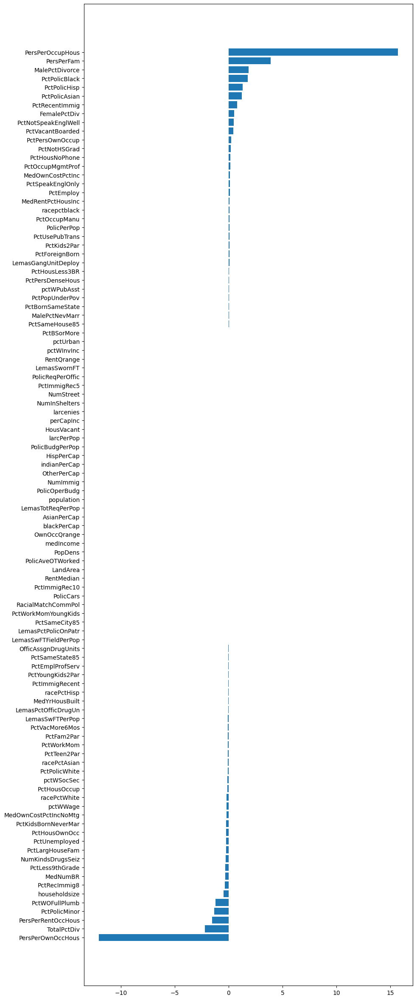

In [ ]:
plt.figure(figsize = (10,30))
plt.barh(list(sorted_dictionary.keys()), sorted_dictionary.values())